# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 13.03.2021

Мягкий дедлайн: 28.03.2021 01:59 MSK

Жёсткий дедлайн: 01.04.2021 01:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



In [1]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

<img src="https://media.giphy.com/media/122PpN1BtlSxYQ/giphy.gif" style="width: 400px">

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [2]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans
import scipy

class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''

        # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
        L = np.diag(X.sum(axis=1)) - X
        eigenvals, eigenvcts = scipy.linalg.eig(L)
        eigenvals = np.real(eigenvals)
        eigenvcts = np.real(eigenvcts)
        eigenvals_sorted_indices = np.argsort(eigenvals)
        return eigenvcts[:,eigenvals_sorted_indices][:,:self.n_components]
        raise NotImplementedError

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [3]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [4]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [5]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [8]:
from scipy.spatial.distance import pdist, squareform
def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''

    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    df = data.copy(deep=True)
    df['RouteNumbers_en'] = df['RouteNumbers_en'].apply(lambda x : x.split('; '))
    df = df.explode('RouteNumbers_en')
    df.drop(columns=['index'], inplace=True)
    df.ID_en = df.index
    return df.groupby('RouteNumbers_en')['ID_en'].apply(list).to_dict()
    raise NotImplementedError


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''

    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    sorted_routes = {}
    for key, unsorted_stops in routes.items():
        route_df = data.loc[unsorted_stops]
        sorted_indexes = []
        unused_indexes = np.arange(len(unsorted_stops))
        dist = squareform(pdist(route_df[['Longitude_WGS84_en','Latitude_WGS84_en']]))    # l2-distance
        sorted_indexes.append(np.argmax(dist.sum(axis=1)))
        while(len(sorted_indexes) != len(unsorted_stops)):
            cur_idx = sorted_indexes[-1]
            unused_indexes = unused_indexes[unused_indexes != cur_idx]
            sorted_indexes.append(unused_indexes[np.argmin(dist[cur_idx][unused_indexes])])
        sorted_routes[key] = np.array(unsorted_stops)[sorted_indexes]
    return sorted_routes
    raise NotImplementedError


def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''

    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    n = data.shape[0]
    adj_matrix = np.zeros((n,n))
    for key, route in sorted_routes.items():
        for i in range(1,len(route)):
            adj_matrix[route[i], route[i-1]] += 1
            adj_matrix[route[i-1], route[i]] += 1
    return adj_matrix
    raise NotImplementedError

In [9]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [11]:
list_colors = ["red", "green", "blue", "black", "yellow"]
color_dict = {i: list_colors[i] for i in range(len(list_colors))}

In [13]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for i,route_id in enumerate(np.random.choice(list(sorted_routes.keys()), size=5)):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords,color=color_dict[i]).add_to(map)
    for id, row in data.loc[sorted_routes[route_id]].iterrows():
        if id == sorted_routes[route_id][0]:
            folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],    # show start of route
                      radius=20,color='brown').add_to(map)
        else:
            folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                      radius=5).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [14]:
import branca.colormap as cm
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''

    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    map = folium.Map([55.75215, 37.61819], zoom_start=12)
    label_set = np.unique(labels)
    label_set = label_set[label_set != -1]
    cmap = cm.linear.Set1_08.to_step(len(label_set)).scale(label_set.min(), label_set.max())
    for cluster in label_set:
        for id, row in data.loc[labels == cluster].iterrows():
            folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                          radius=10,color=cmap(cluster)).add_to(map)
    
    for id, row in data.loc[labels == -1].iterrows():    # noise points
        folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                      radius=5,color='black').add_to(map)
    return map
    raise NotImplementedError

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`. Подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации (можете поэкспериментировать и оставить в ноутбуке картинки только для итоговых значений параметров, также обратите внимание на баланс объектов в кластерах). Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [15]:
from sklearn.cluster import DBSCAN
df = np.array(data[['Longitude_WGS84_en','Latitude_WGS84_en']])

In [16]:
kmeans = KMeans(8)
kmeans.fit(df)
draw_clustered_map(data,kmeans.labels_)

In [18]:
dbscan = DBSCAN(eps=0.0036,metric='l2')
dbscan.fit(df)
draw_clustered_map(data,dbscan.labels_)

In [19]:
gr_cl = GraphClustering(45,75)
gr_preds = gr_cl.fit_predict(adjacency_matrix)
draw_clustered_map(data,gr_preds)

Проинтерпретируйте полученные результаты. Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:** *при кластеризации алгоритмом K-means точки разделяются на области примерно шарообразной формы и одинакового размера. DBSCAN разделяет выборку на кластеры разных форм (необязательно шарообразных - часто встречаются вытянутые кластеры, например, по кольцевой линии) и разных размеров, получаемые кластеры так же отличаются по плотности - данный алгоритм старается отделить плотные кластеры разреженными. В результате спектрального разложения можно увидеть, что остановки разделяются на кластеры, очень похожие на маршруты, их связывающие - видны зоны кольцевой линии, кластеры-"лучи", исходящие от центра.*

*Из плюсов K-means можно отметить сбалансированность получаемых кластеров, однако этот алгоритм в основном находит только шарообразные кластера. В нашем случае имеет больше смысла разделять остановки по маршрутам, которые, как правило, составляют вытянутые области, поэтому данный алгоритм не является подходящим для решения этой задачи (впрочем, кластеризация очень похожа на подразделение центрального округа на отдельные области).*

*DBSCAN в плане разделения кластеров разных форм работает намного лучше - остановки из одного маршрута часто находятся близко, поэтому алгоритм может выделить вытянутые кластеры (например, красно-коричневый кластер на западе кольцевой линии или фиолетовый на западе). Также плюсом этого алгоритма является выделение шумовых точек, не учитывая выбросы, можно достичь более точной клалстеризации. С другой стороны, кластера в результате применения DBSCAN получаются очень разными, есть отдельные большие кластера (например, зелёный на севере) и очень маленькие (состоящие из 3-10 остановок), поэтому кластеризация получается не очень близкой к разделению на отдельные маршруты.*

*Хорошо работает спектральная кластеризация на матрице смежностей. По изображению можно увидеть отдельные компоненты связности, похожие на маршрутные пути. Минусом этого алгоритма можно выделить более долгое время работы (относительно K-means), а также сильные различия результатов при изменениях значений параметров.*

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [20]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1274,politics,379.txt,Election 'could be terror target',Terrorists might try to target the UK in the ...
242,business,243.txt,Making your office work for you,Our mission to brighten up your working lives...
979,politics,084.txt,Job cuts 'false economy' - TUC,"Plans to shed 71,000 civil service jobs will ..."
1785,sport,473.txt,Faultless Federer has no equal,"Roger Federer - nice bloke, fantastic tennis ..."
867,entertainment,358.txt,Film star Fox behind theatre bid,Leading actor Edward Fox is one of the men be...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [21]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [22]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Dell\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Dell\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Dell\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [23]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [24]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [25]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

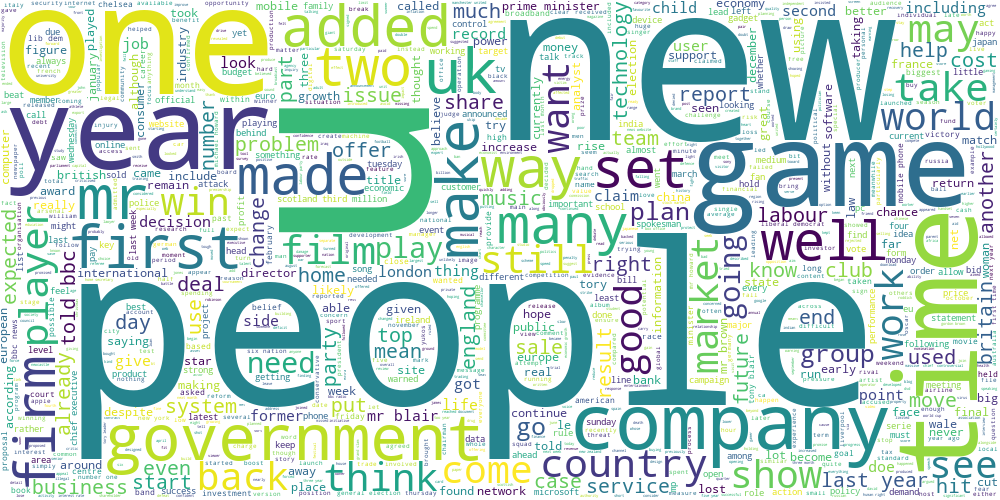

In [26]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:** *темы довольно хорошо интерпретируемы, см. подписи у облаков слов*

In [27]:
from sklearn.feature_extraction.text import TfidfVectorizer
tf_idf = TfidfVectorizer(min_df=0.05)    # drop words with less than 5% occurence
tf_idf.fit(data['text'])

km_text = KMeans(8)
tf_idf_data = tf_idf.transform(data['text']).toarray()
km_text.fit(tf_idf_data)

KMeans()

*Экономика, финансы*

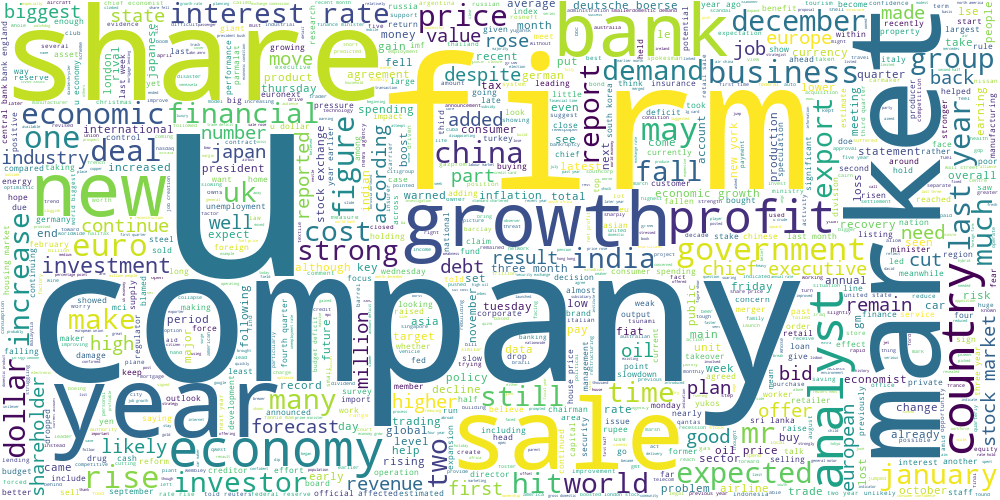

In [28]:
draw_wordcloud(data[km_text.labels_==0].text)

*Спорт*

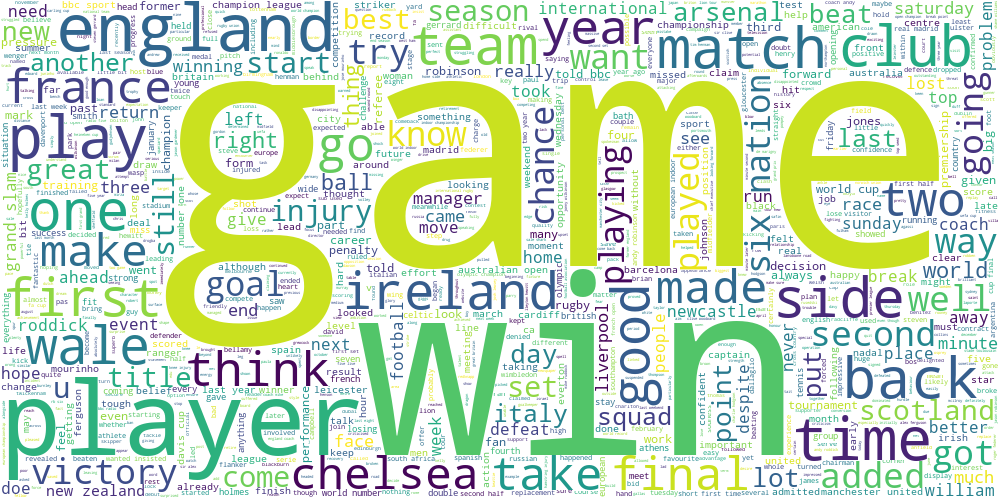

In [29]:
draw_wordcloud(data[km_text.labels_==1].text)

*Технологии, мобильные услуги*

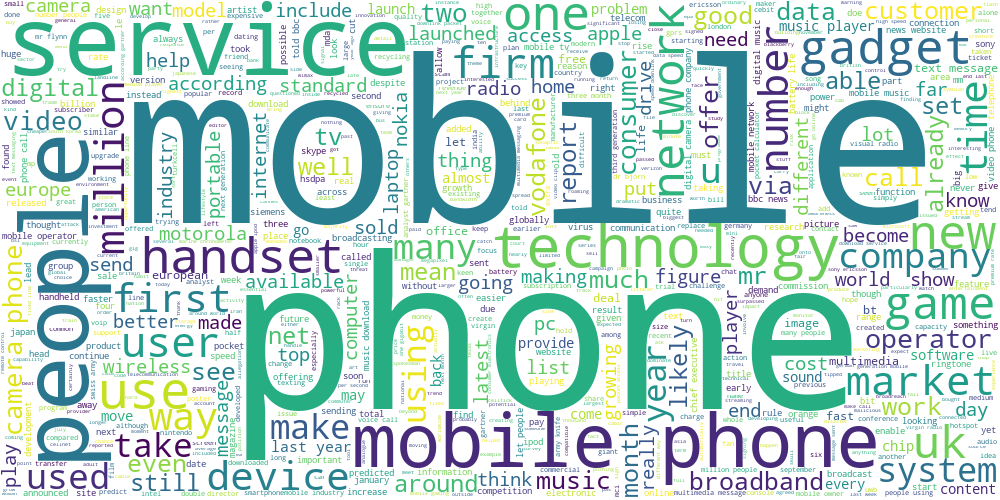

In [30]:
draw_wordcloud(data[km_text.labels_==2].text)

*Правительство, политика*

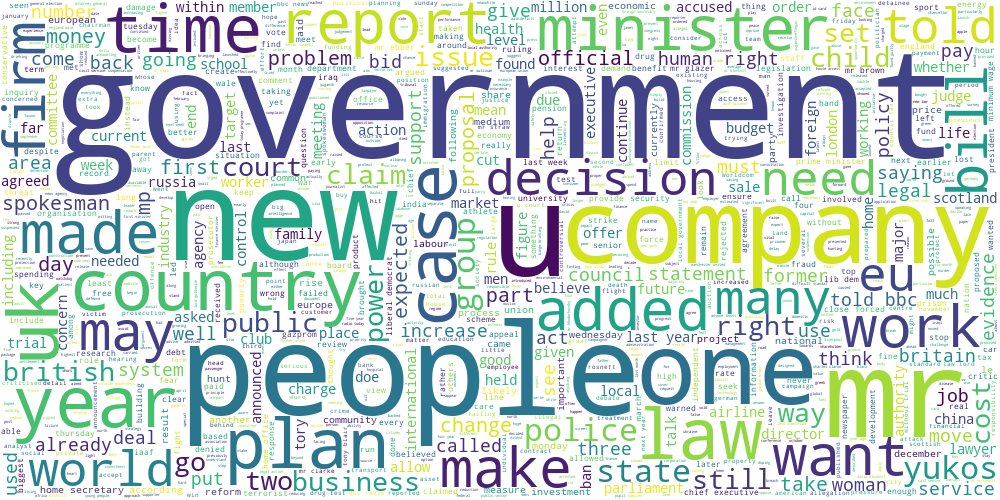

In [31]:
draw_wordcloud(data[km_text.labels_==3].text)

*Музыкальная индустрия*

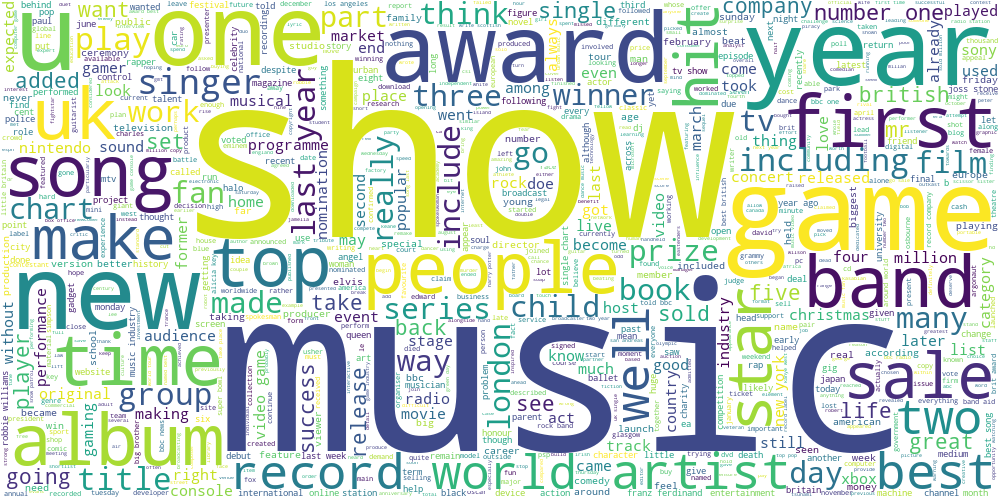

In [32]:
draw_wordcloud(data[km_text.labels_==4].text)

*Киноиндустрия*

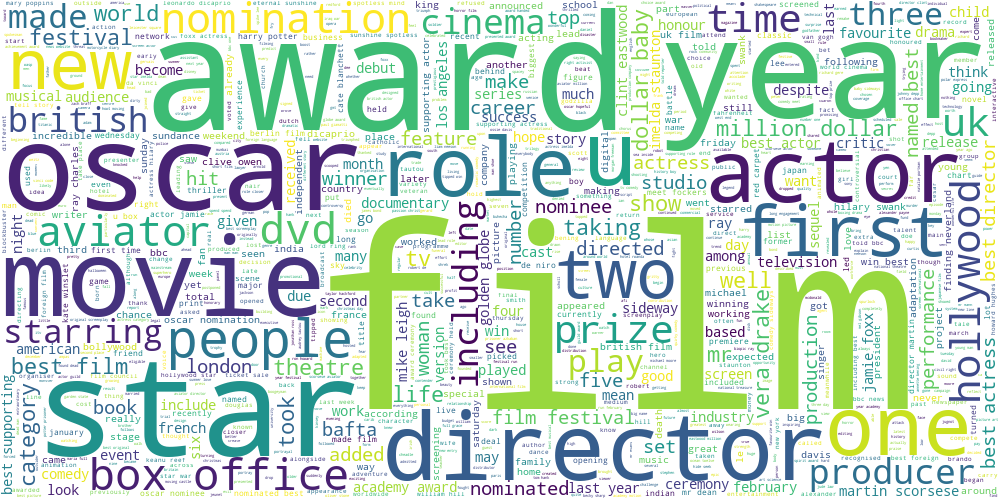

In [33]:
draw_wordcloud(data[km_text.labels_==5].text)

*Политика*

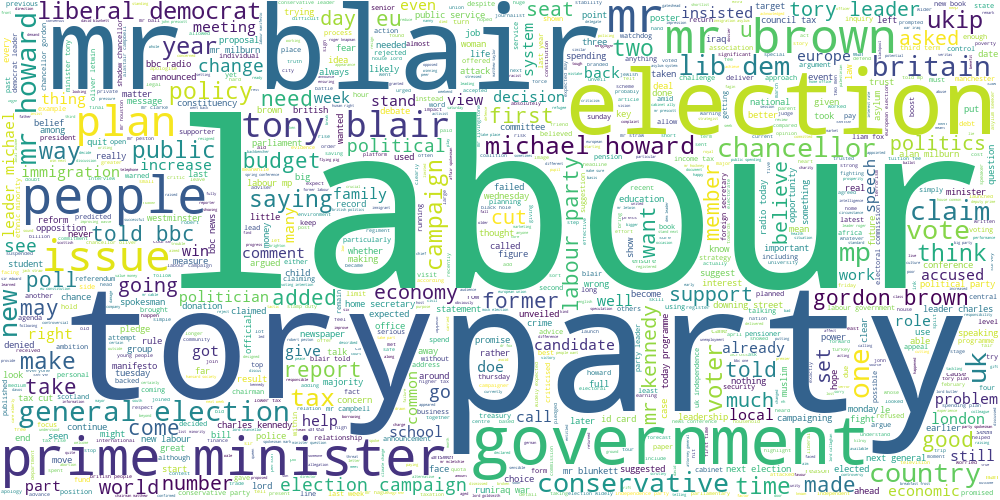

In [34]:
draw_wordcloud(data[km_text.labels_==6].text)

*Технологии*

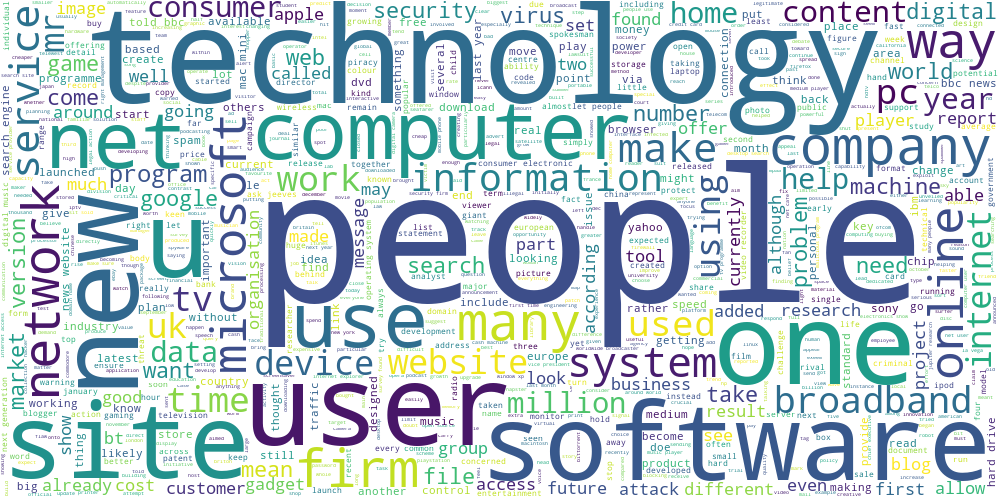

In [35]:
draw_wordcloud(data[km_text.labels_==7].text)

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:** *выписав для каждого кластера по три наиболее вероятных слов, можем заметить, что они согласуются с облаками тегов*

In [36]:
words = np.array(tf_idf.get_feature_names())    # get array of words
words[km_text.cluster_centers_.argsort(axis=1)[:,-3:]]

array([['growth', 'market', 'share'],
       ['england', 'player', 'game'],
       ['service', 'phone', 'mobile'],
       ['would', 'government', 'mr'],
       ['award', 'show', 'music'],
       ['best', 'award', 'film'],
       ['election', 'labour', 'mr'],
       ['people', 'technology', 'user']], dtype='<U13')

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [37]:
from sklearn.cluster import SpectralClustering
km_2_3 = KMeans(6)
sp_2_3 = SpectralClustering(6)
km_2_3.fit(tf_idf_data)
sp_2_3.fit(tf_idf_data)

SpectralClustering(n_clusters=6)

In [40]:
for min_pts in range(3,10):
    for eps in np.logspace(-3,1,20):
        db = DBSCAN(eps=eps, min_samples=min_pts).fit(tf_idf_data).labels_
        print('min_pts = %d, eps = %.3f, n = %d' % (min_pts, eps, len(np.unique(db[db != -1]))))

min_pts = 3, eps = 0.001, n = 0
min_pts = 3, eps = 0.002, n = 0
min_pts = 3, eps = 0.003, n = 0
min_pts = 3, eps = 0.004, n = 0
min_pts = 3, eps = 0.007, n = 0
min_pts = 3, eps = 0.011, n = 0
min_pts = 3, eps = 0.018, n = 0
min_pts = 3, eps = 0.030, n = 0
min_pts = 3, eps = 0.048, n = 0
min_pts = 3, eps = 0.078, n = 0
min_pts = 3, eps = 0.127, n = 0
min_pts = 3, eps = 0.207, n = 0
min_pts = 3, eps = 0.336, n = 1
min_pts = 3, eps = 0.546, n = 3
min_pts = 3, eps = 0.886, n = 51
min_pts = 3, eps = 1.438, n = 1
min_pts = 3, eps = 2.336, n = 1
min_pts = 3, eps = 3.793, n = 1
min_pts = 3, eps = 6.158, n = 1
min_pts = 3, eps = 10.000, n = 1
min_pts = 4, eps = 0.001, n = 0
min_pts = 4, eps = 0.002, n = 0
min_pts = 4, eps = 0.003, n = 0
min_pts = 4, eps = 0.004, n = 0
min_pts = 4, eps = 0.007, n = 0
min_pts = 4, eps = 0.011, n = 0
min_pts = 4, eps = 0.018, n = 0
min_pts = 4, eps = 0.030, n = 0
min_pts = 4, eps = 0.048, n = 0
min_pts = 4, eps = 0.078, n = 0
min_pts = 4, eps = 0.127, n = 0
min_pt

In [41]:
db_2_3 = DBSCAN(eps=0.886, min_samples=9)
db_2_3.fit(tf_idf_data)

DBSCAN(eps=0.886, min_samples=9)

In [42]:
from sklearn.manifold import TSNE
tsne = TSNE(2)
X_emb = tsne.fit_transform(tf_idf_data)

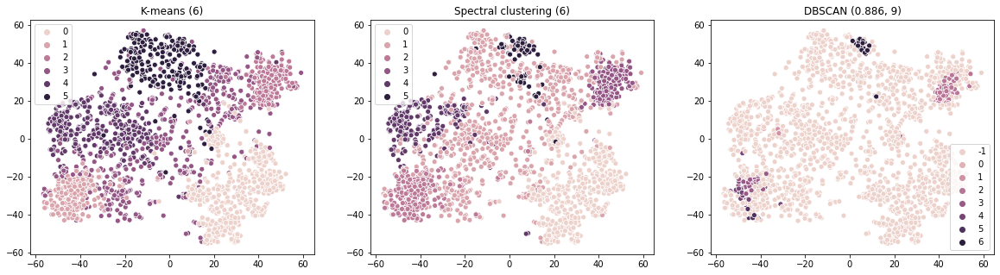

In [48]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1,3,figsize=(20,5))
sns.scatterplot(X_emb[:,0], X_emb[:,1], hue=km_2_3.labels_, ax=axs[0], legend='full')
axs[0].set_title('K-means (6)')
sns.scatterplot(X_emb[:,0], X_emb[:,1], hue=sp_2_3.labels_, ax=axs[1], legend='full')
axs[1].set_title('Spectral clustering (6)')
sns.scatterplot(X_emb[:,0], X_emb[:,1], hue=db_2_3.labels_, ax=axs[2], legend='full')
axs[2].set_title('DBSCAN (0.886, 9)')
plt.show()

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:** *При параметрах DBSCAN, подобранных так, чтобы количество кластеров получилось примерно одинаковым с другими алгоритмами (6), получается очень плохая кластеризация, в основном выделяются шумовые точки (со значением -1), среди которых выделяются маленькие плотные облака.*

*Для K-Means рисунок похож на визуализации географических данных - тоже выделяются кластеры примерно одного размера, все они более-менее шарообразны. Однако стоит отметить, что в данной визуализации кластера больше (чем в географических данных) отличаются друг от друга, какие-то кластеры не такие плотные, как другие и т.п. (это также зависит и от tSNE).*

*В спектральной кластеризации можно увидеть, что некоторые выделенные кластера совпадают с выделенными кластерами в K-means (нижние два кластера), кластеризация не такая сбалансированная, как получилось в K-means: есть один большой кластер (со значением 1) с точками, относящимися к трём разным кластерам в K-means. В отличие от визуализаций на географических данных на текстовых данных выделяются отдельные облака точек, а не вытянутые кластера, что объясняется видом данных - в географических данных матрица смежности опиралась на данные о маршрутах.*

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:** *Да, получились, например, выделились отдельные кластеры с темами компьютерных игр, программного обеспечения, правительства в Европе (много упоминаний ЕС, Англии), музыкальные записи (упоминаются слова dvd, digital, record, piracy etc).*

In [51]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

bow = CountVectorizer(min_df=0.05).fit_transform(data.text)    # drop words with less than 5% occurence rate

lda = LatentDirichletAllocation(n_components = 24)
lda.fit(bow)
topics = lda.transform(bow).argmax(axis=1)

*Выпишем тексты разных кластеров:*

In [52]:
for cluster in np.unique(topics):
    print('Cluster %d' % cluster)
    print(data[topics==cluster].text)
    print('--------')

Cluster 0
446     news corp eye video game market news corp medi...
1094    game warning clearer violent video game carry ...
1841    playstation chip unveiled detail chip designed...
1847    game firm hold audition video game firm biowar...
1848    sony psp console hit u march u gamers able buy...
1875    xbox may unveiled summer detail next generatio...
1879    sporting rival go extra time current slew spor...
1894    game enter classroom video game could soon tra...
1905    game firm tough future uk video game firm face...
1907    nintendo handheld given euro date nintendo new...
1918    mobile game come age bbc news website take loo...
1923    honour uk game maker leading british computer ...
1927    game place class computer game could enhance l...
1935    portable playstation ready go sony playstation...
1948    force strong battlefront warm reception greete...
1949    game award doom shooter doom blasted away comp...
1950    gadget show herald season partner love gear ma...
1951

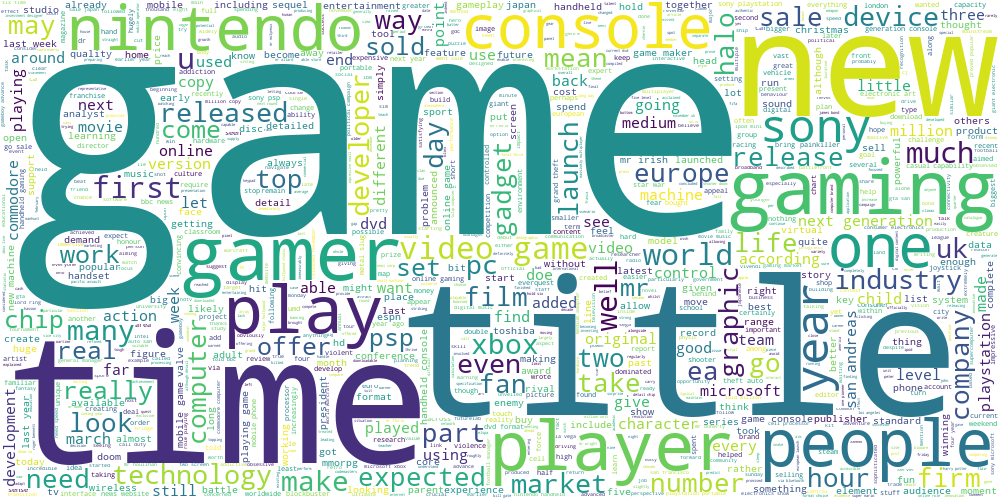

In [53]:
draw_wordcloud(data[topics==0].text)

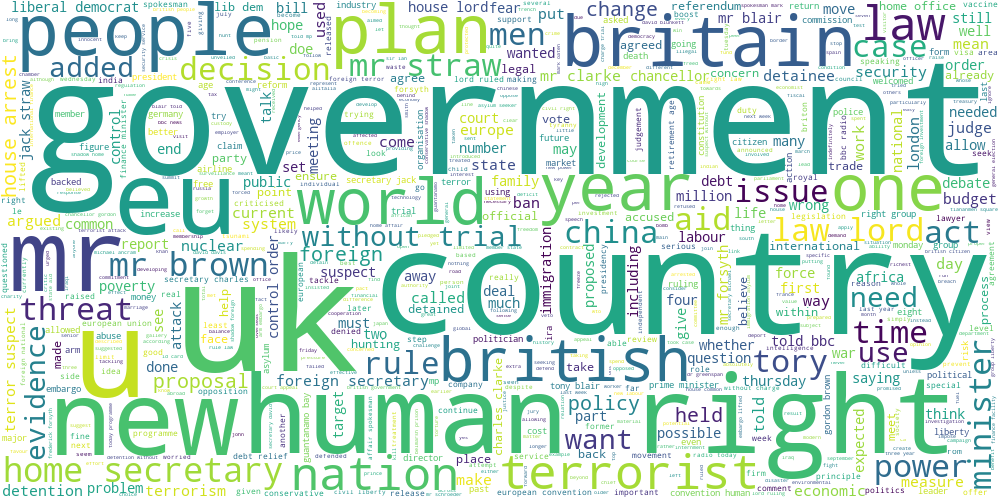

In [54]:
draw_wordcloud(data[topics==12].text)

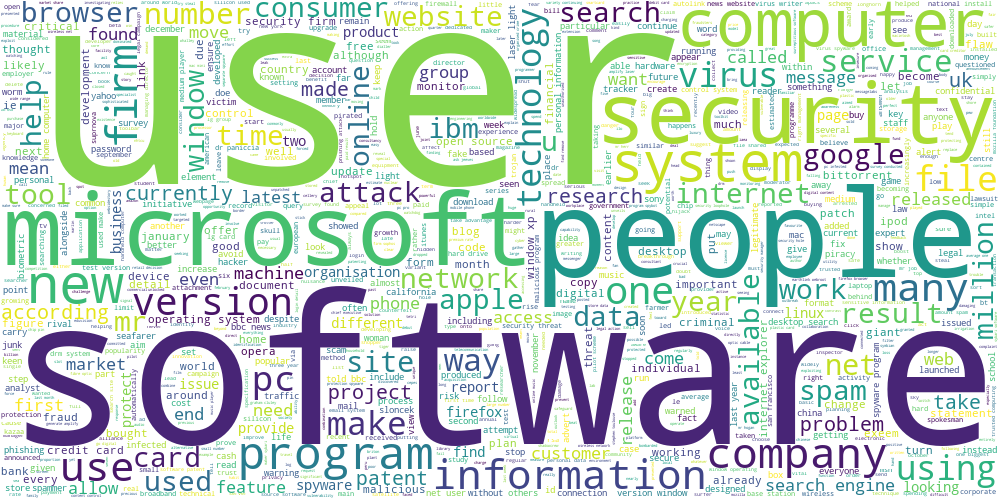

In [55]:
draw_wordcloud(data[topics==19].text)

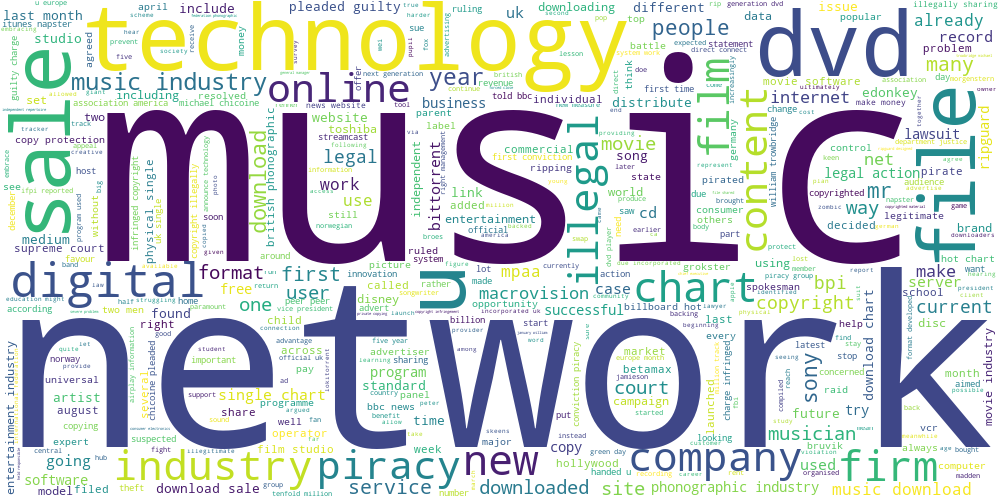

In [58]:
draw_wordcloud(data[topics==17].text)

## Часть 3. Transfer learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [59]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

y = LabelEncoder().fit_transform(data.category)
X_train, X_test, y_train, y_test = train_test_split(data.text, y, test_size=0.3)

In [60]:
from sklearn.metrics import accuracy_score
lr_tf_idf = Pipeline([
    ('tf_idf', TfidfVectorizer()),
    ('logreg', LogisticRegression())
])
lr_tf_idf.fit(X_train, y_train)
train_preds_lr = lr_tf_idf.predict(X_train)
preds_lr = lr_tf_idf.predict(X_test)
print('Logistic regression on tf-idf')
print('\nTrain accuracy: %.4f\tTest accuracy %.4f' % (accuracy_score(y_train, train_preds_lr),
                                                     accuracy_score(y_test, preds_lr)))

Logistic regression on tf-idf

Train accuracy: 0.9961	Test accuracy 0.9716


In [63]:
km_lr = Pipeline([
    ('tf_idf', TfidfVectorizer()),
    ('kmeans', KMeans()),
    ('logreg', LogisticRegression())
])
km_lr.fit(X_train, y_train)

train_preds_km_lr = km_lr.predict(X_train)
preds_km_lr = km_lr.predict(X_test)
print('tf-idf + K-means + Logistic regression')
print('\nTrain accuracy: %.4f\tTest accuracy %.4f' % (accuracy_score(y_train, train_preds_km_lr),
                                                     accuracy_score(y_test, preds_km_lr)))

tf-idf + K-means + Logistic regression

Train accuracy: 0.8433	Test accuracy 0.8623


In [64]:
lda_lr = Pipeline([
    ('bow', CountVectorizer()),
    ('lda', LatentDirichletAllocation()),
    ('logreg', LogisticRegression())
])
lda_lr.fit(X_train, y_train)

train_preds_lda_lr = lda_lr.predict(X_train)
preds_lda_lr = lda_lr.predict(X_test)
print('LDA + Logistic regression')
print('\nTrain accuracy: %.4f\tTest accuracy %.4f' % (accuracy_score(y_train, train_preds_lda_lr),
                                                     accuracy_score(y_test, preds_lda_lr)))

LDA + Logistic regression

Train accuracy: 0.8985	Test accuracy 0.9596


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:** *Наилучшее качество получилось на логистической регрессии на tf-idf. Связано это с тем, что логистическая регрессия приближает правдоподобие распределения тем. На размеченной выборке получается хорошо обучиться, из-за чего на тестовой выборке также выходит высокая точность. Близкий к этому результат получается на LDA, эта модель также основана на приближении правдоподобия распределения слов в текстах. Хуже всего качество наблюдается на модели с использованием K-means, вероятно, из-за случайности инициализации разбиения выборки, а также того, что кластеры на текстовых данных необязательно сферические и одинакового размера.*

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 

In [67]:
X_train_new, X_val, y_train_new, y_val = train_test_split(X_train, y_train, test_size=0.3)
X_train_labeled, X_train_unlabeled, y_train_labeled, _ = train_test_split(X_train_new, y_train_new, test_size=65/70)

In [68]:
reg_Cs = np.logspace(-1, 3, 5)
km_grid = np.arange(2,30,2)

best_params = None
max_val_score = 0
for n in km_grid:
    for C in reg_Cs:
        km_3_2 = Pipeline([
            ('tf_idf', TfidfVectorizer(min_df=0.01)),
            ('kmeans', KMeans(n))
        ])
        km_3_2.fit(pd.concat((X_train_labeled, X_train_unlabeled)))
        lr = LogisticRegression(C=C, max_iter=500)
        lr.fit(km_3_2.transform(X_train_labeled), y_train_labeled)
        print('n_clusters: %d, C: %.3f' % (n, C))
        val_pred = lr.predict(km_3_2.transform(X_val))
        pred = lr.predict(km_3_2.transform(X_train_labeled))
        print('\tLabeled train accuracy: %.4f,\tValidation accuracy: %.4f' % 
              (accuracy_score(y_train_labeled, pred), accuracy_score(y_val, val_pred)))
        if accuracy_score(y_val, val_pred) > max_val_score:
            max_val_score = accuracy_score(y_val, val_pred)
            best_params = (n, C)

n_clusters: 2, C: 0.100
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
n_clusters: 2, C: 1.000
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
n_clusters: 2, C: 10.000
	Labeled train accuracy: 0.3636,	Validation accuracy: 0.2222
n_clusters: 2, C: 100.000
	Labeled train accuracy: 0.4416,	Validation accuracy: 0.3013
n_clusters: 2, C: 1000.000
	Labeled train accuracy: 0.4416,	Validation accuracy: 0.3141
n_clusters: 4, C: 0.100
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
n_clusters: 4, C: 1.000
	Labeled train accuracy: 0.2987,	Validation accuracy: 0.2094
n_clusters: 4, C: 10.000
	Labeled train accuracy: 0.7532,	Validation accuracy: 0.5962
n_clusters: 4, C: 100.000
	Labeled train accuracy: 0.8312,	Validation accuracy: 0.6517
n_clusters: 4, C: 1000.000
	Labeled train accuracy: 0.8312,	Validation accuracy: 0.7030
n_clusters: 6, C: 0.100
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
n_clusters: 6, C: 1.000
	Labeled train accuracy: 0.32

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


n_clusters: 10, C: 1000.000
	Labeled train accuracy: 0.9870,	Validation accuracy: 0.9209
n_clusters: 12, C: 0.100
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
n_clusters: 12, C: 1.000
	Labeled train accuracy: 0.4026,	Validation accuracy: 0.2457
n_clusters: 12, C: 10.000
	Labeled train accuracy: 0.9610,	Validation accuracy: 0.8526
n_clusters: 12, C: 100.000
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.9188


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


n_clusters: 12, C: 1000.000
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.9380
n_clusters: 14, C: 0.100
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
n_clusters: 14, C: 1.000
	Labeled train accuracy: 0.4545,	Validation accuracy: 0.2714
n_clusters: 14, C: 10.000
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.8803
n_clusters: 14, C: 100.000
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.9359


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


n_clusters: 14, C: 1000.000
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9124
n_clusters: 16, C: 0.100
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
n_clusters: 16, C: 1.000
	Labeled train accuracy: 0.4805,	Validation accuracy: 0.2885
n_clusters: 16, C: 10.000
	Labeled train accuracy: 0.9610,	Validation accuracy: 0.8718
n_clusters: 16, C: 100.000
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.9380


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


n_clusters: 16, C: 1000.000
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9274
n_clusters: 18, C: 0.100
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
n_clusters: 18, C: 1.000
	Labeled train accuracy: 0.5065,	Validation accuracy: 0.3098
n_clusters: 18, C: 10.000
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.8846
n_clusters: 18, C: 100.000
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.9359


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


n_clusters: 18, C: 1000.000
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9380
n_clusters: 20, C: 0.100
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
n_clusters: 20, C: 1.000
	Labeled train accuracy: 0.5325,	Validation accuracy: 0.3226
n_clusters: 20, C: 10.000
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.8590
n_clusters: 20, C: 100.000
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.9252


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


n_clusters: 20, C: 1000.000
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9274
n_clusters: 22, C: 0.100
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
n_clusters: 22, C: 1.000
	Labeled train accuracy: 0.6104,	Validation accuracy: 0.3910
n_clusters: 22, C: 10.000
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.8996
n_clusters: 22, C: 100.000
	Labeled train accuracy: 0.9870,	Validation accuracy: 0.9124


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


n_clusters: 22, C: 1000.000
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9338
n_clusters: 24, C: 0.100
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
n_clusters: 24, C: 1.000
	Labeled train accuracy: 0.6494,	Validation accuracy: 0.3953
n_clusters: 24, C: 10.000
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.8974
n_clusters: 24, C: 100.000
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9167


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


n_clusters: 24, C: 1000.000
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9380
n_clusters: 26, C: 0.100
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
n_clusters: 26, C: 1.000
	Labeled train accuracy: 0.6883,	Validation accuracy: 0.4573
n_clusters: 26, C: 10.000
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.9124
n_clusters: 26, C: 100.000
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.9209


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


n_clusters: 26, C: 1000.000
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9316
n_clusters: 28, C: 0.100
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
n_clusters: 28, C: 1.000
	Labeled train accuracy: 0.6234,	Validation accuracy: 0.4145
n_clusters: 28, C: 10.000
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.9060
n_clusters: 28, C: 100.000
	Labeled train accuracy: 0.9870,	Validation accuracy: 0.9274
n_clusters: 28, C: 1000.000
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9209


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [69]:
best_params

(10, 100.0)

In [70]:
km_3_2 = Pipeline([
    ('tf_idf', TfidfVectorizer(min_df=0.01)),
    ('kmeans', KMeans(best_params[0]))
])
km_3_2.fit(pd.concat((X_train_labeled, X_train_unlabeled)))
lr_km_3_2 = LogisticRegression(C=best_params[1], max_iter=500)
lr_km_3_2.fit(km_3_2.transform(X_train_labeled), y_train_labeled)
pred_km = lr_km_3_2.predict(km_3_2.transform(X_test))
train_pred_km = lr_km_3_2.predict(km_3_2.transform(X_train_labeled))
print('Labeled train accuracy: %.4f,\tTest accuracy: %.4f' % 
      (accuracy_score(y_train_labeled, train_pred_km), accuracy_score(y_test, pred_km)))


Labeled train accuracy: 0.9740,	Test accuracy: 0.9311


In [72]:
reg_Cs = np.logspace(-1, 3, 5)
lda_grid = np.arange(2,30,2)

best_params_lda = None
max_val_score = 0
for n in lda_grid:
    for C in reg_Cs:
        lda_3_2 = Pipeline([
            ('bow', CountVectorizer(min_df=0.01)),
            ('lda', LatentDirichletAllocation(n))
        ])
        lda_3_2.fit(pd.concat((X_train_labeled, X_train_unlabeled)))
        lr = LogisticRegression(C=C, max_iter=500)
        lr.fit(lda_3_2.transform(X_train_labeled), y_train_labeled)
        print('n_clusters: %d, C: %.3f' % (n, C))
        val_pred = lr.predict(lda_3_2.transform(X_val))
        pred = lr.predict(lda_3_2.transform(X_train_labeled))
        print('\tLabeled train accuracy: %.4f,\tValidation accuracy: %.4f' % 
              (accuracy_score(y_train_labeled, pred), accuracy_score(y_val, val_pred)))
        if accuracy_score(y_val, val_pred) > max_val_score:
            max_val_score = accuracy_score(y_val, val_pred)
            best_params_lda = (n, C)

n_clusters: 2, C: 0.100
	Labeled train accuracy: 0.4675,	Validation accuracy: 0.3248
n_clusters: 2, C: 1.000
	Labeled train accuracy: 0.4545,	Validation accuracy: 0.3397
n_clusters: 2, C: 10.000
	Labeled train accuracy: 0.5455,	Validation accuracy: 0.4701
n_clusters: 2, C: 100.000
	Labeled train accuracy: 0.5195,	Validation accuracy: 0.4466
n_clusters: 2, C: 1000.000
	Labeled train accuracy: 0.5195,	Validation accuracy: 0.4231
n_clusters: 4, C: 0.100
	Labeled train accuracy: 0.7273,	Validation accuracy: 0.6154
n_clusters: 4, C: 1.000
	Labeled train accuracy: 0.8571,	Validation accuracy: 0.7222
n_clusters: 4, C: 10.000
	Labeled train accuracy: 0.8701,	Validation accuracy: 0.8141
n_clusters: 4, C: 100.000
	Labeled train accuracy: 0.9091,	Validation accuracy: 0.8120
n_clusters: 4, C: 1000.000
	Labeled train accuracy: 0.8571,	Validation accuracy: 0.7286
n_clusters: 6, C: 0.100
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.8675
n_clusters: 6, C: 1.000
	Labeled train accuracy: 0.90

In [73]:
best_params_lda

(12, 100.0)

In [74]:
lda_3_2 = Pipeline([
    ('bow', CountVectorizer(min_df=0.01)),
    ('lda', LatentDirichletAllocation(best_params_lda[0]))
])
lda_3_2.fit(pd.concat((X_train_labeled, X_train_unlabeled)))
lr = LogisticRegression(C=best_params_lda[1], max_iter=500)
lr.fit(lda_3_2.transform(X_train_labeled), y_train_labeled)
pred_lda = lr.predict(lda_3_2.transform(X_test))
train_pred_lda = lr.predict(lda_3_2.transform(X_train_labeled))
print('Labeled train accuracy: %.4f,\tTest accuracy: %.4f' % 
      (accuracy_score(y_train_labeled, train_pred_lda), accuracy_score(y_test, pred_lda)))

Labeled train accuracy: 1.0000,	Test accuracy: 0.9147


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:** *При подборе параметров для модели с K-means, точность классификации значительно увеличилась (в предыдущем задании было 0.84, 0.86 на обучающей и тестовой выборках, после подбора параметров по валидационной выборке стало 0.97, 0.93). На модели с LDA произошло переобучение - на обучающей выборке тексты классифицируются без ошибок, однако на тестовой выборке точность снизилась - в предыдущем задании было около 0.95, здесь получилось 0.92. Стоит также заметить, что подобранное количество тем/кластеров находится в пределах 10-12. Таким образом, в unsupervised-методах важно подбирать значения параметров, опираясь по возможности на какие-то знания о данной выборке.*

## Бонус

**Задание 4 (1 балл)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [75]:
from sklearn.semi_supervised import LabelPropagation, LabelSpreading, SelfTrainingClassifier

In [76]:
from sklearn.base import TransformerMixin
class DenseTransformer(TransformerMixin):    # array.todense() for pipelines

    def fit(self, X, y=None, **fit_params):
        return self

    def transform(self, X, y=None, **fit_params):
        return X.todense()

*LabelPropagation*

*Подберём параметр гамма:*

In [78]:
gamma_grid = np.logspace(1,2,50)

best_params_lp_rbf = None
max_val_score = 0
for gamma in gamma_grid:
    lp = Pipeline([
        ('tf_idf', TfidfVectorizer(min_df=0.01)),
        ('to_dense', DenseTransformer()),
        ('label_prop', LabelPropagation(gamma=gamma))
    ])
    lp.fit(pd.concat((X_train_labeled, X_train_unlabeled)), 
           np.concatenate((y_train_labeled, -np.ones(X_train_unlabeled.shape[0]))))
    print('gamma: %.4f' % (gamma))
    val_pred = lp.predict(X_val)
    pred = lp.predict(X_train_labeled)
    print('\tLabeled train accuracy: %.4f,\tValidation accuracy: %.4f' % 
          (accuracy_score(y_train_labeled, pred), accuracy_score(y_val, val_pred)))
    if accuracy_score(y_val, val_pred) > max_val_score:
        max_val_score = accuracy_score(y_val, val_pred)
        best_params_lp_rbf = gamma

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\semi_supervised\_label_propagation.py:290: ConvergenceWarning: max_iter=1000 was reached without convergence.
  warnings.warn(


gamma: 10.0000
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8846


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\semi_supervised\_label_propagation.py:290: ConvergenceWarning: max_iter=1000 was reached without convergence.
  warnings.warn(


gamma: 10.4811
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8889


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\semi_supervised\_label_propagation.py:290: ConvergenceWarning: max_iter=1000 was reached without convergence.
  warnings.warn(


gamma: 10.9854
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8889


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\semi_supervised\_label_propagation.py:290: ConvergenceWarning: max_iter=1000 was reached without convergence.
  warnings.warn(


gamma: 11.5140
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8953


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\semi_supervised\_label_propagation.py:290: ConvergenceWarning: max_iter=1000 was reached without convergence.
  warnings.warn(


gamma: 12.0679
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8974


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\semi_supervised\_label_propagation.py:290: ConvergenceWarning: max_iter=1000 was reached without convergence.
  warnings.warn(


gamma: 12.6486
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8974


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\semi_supervised\_label_propagation.py:290: ConvergenceWarning: max_iter=1000 was reached without convergence.
  warnings.warn(


gamma: 13.2571
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8996


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\semi_supervised\_label_propagation.py:290: ConvergenceWarning: max_iter=1000 was reached without convergence.
  warnings.warn(


gamma: 13.8950
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9017


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\semi_supervised\_label_propagation.py:290: ConvergenceWarning: max_iter=1000 was reached without convergence.
  warnings.warn(


gamma: 14.5635
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9017
gamma: 15.2642
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9017
gamma: 15.9986
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9060
gamma: 16.7683
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8974
gamma: 17.5751
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8932
gamma: 18.4207
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8932
gamma: 19.3070
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8910
gamma: 20.2359
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8910
gamma: 21.2095
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8889
gamma: 22.2300
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8868
gamma: 23.2995
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8825
gamma: 24.4205
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8803
gamma: 25.5955
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8782
gamma: 26.82

In [79]:
print('best gamma: %.4f' % best_params_lp_rbf)
lp = Pipeline([
    ('tf_idf', TfidfVectorizer(min_df=0.01)),
    ('to_dense', DenseTransformer()),
    ('label_prop', LabelPropagation(gamma=best_params_lp_rbf))
])
lp.fit(pd.concat((X_train_labeled, X_train_unlabeled)), 
       np.concatenate((y_train_labeled, -np.ones(X_train_unlabeled.shape[0]))))

print('Labeled train score: %.4f' % accuracy_score(y_train_labeled,lp.predict(X_train_labeled)))
print('Test score: %.4f' % accuracy_score(y_test,lp.predict(X_test)))

best gamma: 15.9986
Labeled train score: 1.0000
Test score: 0.8922


*Примечание: в модели также можно использовать knn в качестве ядра, однако на наших данных результаты получаются очень плохими*

In [80]:
lp = Pipeline([
    ('tf_idf', TfidfVectorizer(min_df=0.01)),
    ('to_dense', DenseTransformer()),
    ('label_prop', LabelPropagation(kernel='knn'))
])
lp.fit(pd.concat((X_train_labeled, X_train_unlabeled)), 
       np.concatenate((y_train_labeled, -np.ones(X_train_unlabeled.shape[0]))))

print('Labeled train score: %.4f' % accuracy_score(y_train_labeled,lp.predict(X_train_labeled)))
print('Test score: %.4f' % accuracy_score(y_test,lp.predict(X_test)))

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\semi_supervised\_label_propagation.py:281: RuntimeWarning: invalid value encountered in true_divide
  self.label_distributions_ /= normalizer
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\semi_supervised\_label_propagation.py:290: ConvergenceWarning: max_iter=1000 was reached without convergence.
  warnings.warn(


Labeled train score: 0.1429
Test score: 0.2575


*LabelSpreading*

In [81]:
gamma_grid = np.logspace(1,2,50)

best_params_ls_rbf = None
max_val_score = 0
for gamma in gamma_grid:
    ls = Pipeline([
        ('tf_idf', TfidfVectorizer(min_df=0.01)),
        ('to_dense', DenseTransformer()),
        ('label_spread', LabelSpreading(gamma=gamma))
    ])
    ls.fit(pd.concat((X_train_labeled, X_train_unlabeled)), 
           np.concatenate((y_train_labeled, -np.ones(X_train_unlabeled.shape[0]))))
    print('gamma: %.4f' % (gamma))
    val_pred = ls.predict(X_val)
    pred = ls.predict(X_train_labeled)
    print('\tLabeled train accuracy: %.4f,\tValidation accuracy: %.4f' % 
          (accuracy_score(y_train_labeled, pred), accuracy_score(y_val, val_pred)))
    if accuracy_score(y_val, val_pred) > max_val_score:
        max_val_score = accuracy_score(y_val, val_pred)
        best_params_ls_rbf = gamma

gamma: 10.0000
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8248
gamma: 10.4811
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8376
gamma: 10.9854
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8504
gamma: 11.5140
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8654
gamma: 12.0679
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8675
gamma: 12.6486
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8675
gamma: 13.2571
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8697
gamma: 13.8950
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8782
gamma: 14.5635
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8761
gamma: 15.2642
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8761
gamma: 15.9986
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8782
gamma: 16.7683
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8697
gamma: 17.5751
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8718
gamma: 18.42

In [82]:
print('best gamma: %.4f' % best_params_ls_rbf)
ls = Pipeline([
    ('tf_idf', TfidfVectorizer(min_df=0.01)),
    ('to_dense', DenseTransformer()),
    ('label_spread', LabelSpreading(gamma=best_params_ls_rbf))
])
ls.fit(pd.concat((X_train_labeled, X_train_unlabeled)), 
       np.concatenate((y_train_labeled, -np.ones(X_train_unlabeled.shape[0]))))

print('Labeled train score: %.4f' % accuracy_score(y_train_labeled,ls.predict(X_train_labeled)))
print('Test score: %.4f' % accuracy_score(y_test,ls.predict(X_test)))

best gamma: 13.8950
Labeled train score: 1.0000
Test score: 0.8503


*SelfTrainingClassifier with LR*

In [83]:
reg_Cs = np.logspace(-1, 3, 20)
best_C = None
for C in reg_Cs:
    stc = Pipeline([
        ('tf_idf', TfidfVectorizer(min_df=0.01)),
        ('to_dense', DenseTransformer()),
        ('self_lr', SelfTrainingClassifier(LogisticRegression(C=C)))
    ])
    stc.fit(pd.concat((X_train_labeled, X_train_unlabeled)), 
       np.concatenate((y_train_labeled, -np.ones(X_train_unlabeled.shape[0]))))
    print('C: %.4f' % (C))
    val_pred = stc.predict(X_val)
    pred = stc.predict(X_train_labeled)
    print('\tLabeled train accuracy: %.4f,\tValidation accuracy: %.4f' % 
          (accuracy_score(y_train_labeled, pred), accuracy_score(y_val, val_pred)))
    if accuracy_score(y_val, val_pred) > max_val_score:
        max_val_score = accuracy_score(y_val, val_pred)
        best_C = C

C: 0.1000
	Labeled train accuracy: 0.4026,	Validation accuracy: 0.1816
C: 0.1624
	Labeled train accuracy: 0.6234,	Validation accuracy: 0.2372
C: 0.2637
	Labeled train accuracy: 0.8442,	Validation accuracy: 0.3547
C: 0.4281
	Labeled train accuracy: 0.9481,	Validation accuracy: 0.4936
C: 0.6952
	Labeled train accuracy: 0.9870,	Validation accuracy: 0.6261
C: 1.1288
	Labeled train accuracy: 0.9870,	Validation accuracy: 0.7308
C: 1.8330
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.7991
C: 2.9764
	Labeled train accuracy: 0.9870,	Validation accuracy: 0.2756
C: 4.8329
	Labeled train accuracy: 0.9870,	Validation accuracy: 0.5449
C: 7.8476
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.7479
C: 12.7427
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.7949
C: 20.6914
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.8675
C: 33.5982
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9231
C: 54.5559
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9444
C:

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i 

C: 143.8450
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9551


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i 

C: 233.5721
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9274


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


C: 379.2690
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9487


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


C: 615.8482
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9423


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i 

C: 1000.0000
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9509


In [84]:
print('best C: %.4f' % best_C)
stc = Pipeline([
    ('tf_idf', TfidfVectorizer(min_df=0.01)),
    ('to_dense', DenseTransformer()),
    ('self_lr', SelfTrainingClassifier(LogisticRegression(C=C)))
])
stc.fit(pd.concat((X_train_labeled, X_train_unlabeled)), 
       np.concatenate((y_train_labeled, -np.ones(X_train_unlabeled.shape[0]))))

print('Labeled train score: %.4f' % accuracy_score(y_train_labeled,stc.predict(X_train_labeled)))
print('Test score: %.4f' % accuracy_score(y_test,stc.predict(X_test)))

best C: 143.8450


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i 

Labeled train score: 1.0000
Test score: 0.9581


*SelfTrainingClassifier with SVM*

In [87]:
from sklearn.svm import SVC
reg_Cs = np.logspace(-1, 3, 20)
best_C_svm = None
max_val_score = 0
for C in reg_Cs:
    stc = Pipeline([
        ('tf_idf', TfidfVectorizer(min_df=0.01)),
        ('to_dense', DenseTransformer()),
        ('self_svm', SelfTrainingClassifier(SVC(C=C, probability=True)))
    ])
    stc.fit(pd.concat((X_train_labeled, X_train_unlabeled)), 
       np.concatenate((y_train_labeled, -np.ones(X_train_unlabeled.shape[0]))))
    print('C: %.4f' % (C))
    val_pred = stc.predict(X_val)
    pred = stc.predict(X_train_labeled)
    print('\tLabeled train accuracy: %.4f,\tValidation accuracy: %.4f' % 
          (accuracy_score(y_train_labeled, pred), accuracy_score(y_val, val_pred)))
    if accuracy_score(y_val, val_pred) > max_val_score:
        max_val_score = accuracy_score(y_val, val_pred)
        best_C_svm = C

C: 0.1000
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
C: 0.1624
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
C: 0.2637
	Labeled train accuracy: 0.2597,	Validation accuracy: 0.1603
C: 0.4281
	Labeled train accuracy: 0.5974,	Validation accuracy: 0.4829
C: 0.6952
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9402
C: 1.1288
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9509
C: 1.8330
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9487
C: 2.9764
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9444
C: 4.8329
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9487
C: 7.8476
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9466
C: 12.7427
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9402
C: 20.6914
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9423
C: 33.5982
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9444
C: 54.5559
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.9487
C:

In [94]:
print('best C: %.4f' % best_C_svm)
self_svm = Pipeline([
    ('tf_idf', TfidfVectorizer(min_df=0.01)),
    ('to_dense', DenseTransformer()),
    ('self_svm', SelfTrainingClassifier(SVC(C=best_C_svm,probability=True)))
])
self_svm.fit(pd.concat((X_train_labeled, X_train_unlabeled)), 
       np.concatenate((y_train_labeled, -np.ones(X_train_unlabeled.shape[0]))))

print('Labeled train score: %.4f' % accuracy_score(y_train_labeled,self_svm.predict(X_train_labeled)))
print('Test score: %.4f' % accuracy_score(y_test,self_svm.predict(X_test)))

best C: 1.1288
Labeled train score: 1.0000
Test score: 0.9581


*Попробуем также обучить DecisionTree и RandomForest*

*SelfTrainingClassifier with DecisionTreeClassifier*

In [100]:
from sklearn.tree import DecisionTreeClassifier
min_split_grid = np.arange(2,10)
min_leaf_grid = np.arange(1,6)
best_params_self_dt = None
max_val_score = 0
for split in min_split_grid:
    for min_leaf in min_leaf_grid:
        self_dt = Pipeline([
            ('tf_idf', TfidfVectorizer(min_df=0.01)),
            ('to_dense', DenseTransformer()),
            ('self_dt', SelfTrainingClassifier(DecisionTreeClassifier(min_samples_split=split,min_samples_leaf=min_leaf)))
        ])
        self_dt.fit(pd.concat((X_train_labeled, X_train_unlabeled)), 
           np.concatenate((y_train_labeled, -np.ones(X_train_unlabeled.shape[0]))))
        print('min samples split: %d, min samples leaf: %d' % (split, min_leaf))
        val_pred = self_dt.predict(X_val)
        pred = self_dt.predict(X_train_labeled)
        print('\tLabeled train accuracy: %.4f,\tValidation accuracy: %.4f' % 
              (accuracy_score(y_train_labeled, pred), accuracy_score(y_val, val_pred)))
        if accuracy_score(y_val, val_pred) > max_val_score:
            max_val_score = accuracy_score(y_val, val_pred)
            best_params_self_dt = (split, min_leaf)

min samples split: 2, min samples leaf: 1
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.5427
min samples split: 2, min samples leaf: 2
	Labeled train accuracy: 0.9481,	Validation accuracy: 0.5791
min samples split: 2, min samples leaf: 3
	Labeled train accuracy: 0.9091,	Validation accuracy: 0.5791
min samples split: 2, min samples leaf: 4
	Labeled train accuracy: 0.8571,	Validation accuracy: 0.5427
min samples split: 2, min samples leaf: 5
	Labeled train accuracy: 0.8052,	Validation accuracy: 0.5342
min samples split: 3, min samples leaf: 1
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.5427
min samples split: 3, min samples leaf: 2
	Labeled train accuracy: 0.9481,	Validation accuracy: 0.5385
min samples split: 3, min samples leaf: 3
	Labeled train accuracy: 0.9091,	Validation accuracy: 0.5791
min samples split: 3, min samples leaf: 4
	Labeled train accuracy: 0.8571,	Validation accuracy: 0.5427
min samples split: 3, min samples leaf: 5
	Labeled train accuracy: 0.8052

In [104]:
print('best min_split, min_leaf: %d %d' % best_params_self_dt)
self_dt = Pipeline([
    ('tf_idf', TfidfVectorizer(min_df=0.01)),
    ('to_dense', DenseTransformer()),
    ('self_dt', SelfTrainingClassifier(DecisionTreeClassifier(min_samples_split=best_params_self_dt[0], 
                                                               min_samples_leaf=best_params_self_dt[1])))
])
self_dt.fit(pd.concat((X_train_labeled, X_train_unlabeled)), 
       np.concatenate((y_train_labeled, -np.ones(X_train_unlabeled.shape[0]))))

print('Labeled train score: %.4f' % accuracy_score(y_train_labeled,self_dt.predict(X_train_labeled)))
print('Test score: %.4f' % accuracy_score(y_test,self_dt.predict(X_test)))

best min_split, min_leaf: 5 3
Labeled train score: 0.9091
Test score: 0.5659


*SelfTrainingClassifier with RandomForestClassifier*

In [108]:
from sklearn.ensemble import RandomForestClassifier
min_split_grid = np.arange(2,10)
min_leaf_grid = np.arange(1,6)
n_est_grid= np.logspace(1,2,4)
best_params_self_rf = None
max_val_score = 0
for n in n_est_grid:
    for split in min_split_grid:
        for min_leaf in min_leaf_grid:
            self_rf = Pipeline([
                ('tf_idf', TfidfVectorizer(min_df=0.01)),
                ('to_dense', DenseTransformer()),
                ('self_rf', SelfTrainingClassifier(
                    RandomForestClassifier(n_estimators=int(n),min_samples_split=split,min_samples_leaf=min_leaf)))
            ])
            self_rf.fit(pd.concat((X_train_labeled, X_train_unlabeled)), 
               np.concatenate((y_train_labeled, -np.ones(X_train_unlabeled.shape[0]))))
            print('n_estimators = %d, min samples split: %d, min samples leaf: %d' % (int(n), split, min_leaf))
            val_pred = self_rf.predict(X_val)
            pred = self_rf.predict(X_train_labeled)
            print('\tLabeled train accuracy: %.4f,\tValidation accuracy: %.4f' % 
                  (accuracy_score(y_train_labeled, pred), accuracy_score(y_val, val_pred)))
            if accuracy_score(y_val, val_pred) > max_val_score:
                max_val_score = accuracy_score(y_val, val_pred)
                best_params_self_rf = (int(n), split, min_leaf)

n_estimators = 10, min samples split: 2, min samples leaf: 1
	Labeled train accuracy: 0.9740,	Validation accuracy: 0.5278
n_estimators = 10, min samples split: 2, min samples leaf: 2
	Labeled train accuracy: 0.8571,	Validation accuracy: 0.4594
n_estimators = 10, min samples split: 2, min samples leaf: 3
	Labeled train accuracy: 0.5455,	Validation accuracy: 0.3120
n_estimators = 10, min samples split: 2, min samples leaf: 4
	Labeled train accuracy: 0.9091,	Validation accuracy: 0.5321
n_estimators = 10, min samples split: 2, min samples leaf: 5
	Labeled train accuracy: 0.8442,	Validation accuracy: 0.5128
n_estimators = 10, min samples split: 3, min samples leaf: 1
	Labeled train accuracy: 0.9481,	Validation accuracy: 0.3419
n_estimators = 10, min samples split: 3, min samples leaf: 2
	Labeled train accuracy: 0.9610,	Validation accuracy: 0.6944
n_estimators = 10, min samples split: 3, min samples leaf: 3
	Labeled train accuracy: 0.4935,	Validation accuracy: 0.2863
n_estimators = 10, min s

n_estimators = 21, min samples split: 7, min samples leaf: 4
	Labeled train accuracy: 0.9221,	Validation accuracy: 0.5363
n_estimators = 21, min samples split: 7, min samples leaf: 5
	Labeled train accuracy: 0.9351,	Validation accuracy: 0.5812
n_estimators = 21, min samples split: 8, min samples leaf: 1
	Labeled train accuracy: 0.8052,	Validation accuracy: 0.3120
n_estimators = 21, min samples split: 8, min samples leaf: 2
	Labeled train accuracy: 0.4805,	Validation accuracy: 0.2778
n_estimators = 21, min samples split: 8, min samples leaf: 3
	Labeled train accuracy: 0.9870,	Validation accuracy: 0.6389
n_estimators = 21, min samples split: 8, min samples leaf: 4
	Labeled train accuracy: 0.9351,	Validation accuracy: 0.6432
n_estimators = 21, min samples split: 8, min samples leaf: 5
	Labeled train accuracy: 0.9351,	Validation accuracy: 0.5791
n_estimators = 21, min samples split: 9, min samples leaf: 1
	Labeled train accuracy: 0.7013,	Validation accuracy: 0.2179
n_estimators = 21, min s

n_estimators = 100, min samples split: 5, min samples leaf: 2
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.7350
n_estimators = 100, min samples split: 5, min samples leaf: 3
	Labeled train accuracy: 0.9870,	Validation accuracy: 0.7885
n_estimators = 100, min samples split: 5, min samples leaf: 4
	Labeled train accuracy: 0.9870,	Validation accuracy: 0.6389
n_estimators = 100, min samples split: 5, min samples leaf: 5
	Labeled train accuracy: 0.9351,	Validation accuracy: 0.5662
n_estimators = 100, min samples split: 6, min samples leaf: 1
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.2927
n_estimators = 100, min samples split: 6, min samples leaf: 2
	Labeled train accuracy: 1.0000,	Validation accuracy: 0.7457
n_estimators = 100, min samples split: 6, min samples leaf: 3
	Labeled train accuracy: 0.9870,	Validation accuracy: 0.7500
n_estimators = 100, min samples split: 6, min samples leaf: 4
	Labeled train accuracy: 0.9870,	Validation accuracy: 0.6496
n_estimators = 1

In [114]:
print('best n_est, min_split, min_leaf: %d %d %d' % best_params_self_rf)
self_rf = Pipeline([
    ('tf_idf', TfidfVectorizer(min_df=0.01)),
    ('to_dense', DenseTransformer()),
    ('self_rf', SelfTrainingClassifier(RandomForestClassifier(n_estimators=best_params_self_rf[0], 
                                                              min_samples_split=best_params_self_rf[1],
                                                              min_samples_leaf=best_params_self_rf[2])))
])
self_rf.fit(pd.concat((X_train_labeled, X_train_unlabeled)), 
       np.concatenate((y_train_labeled, -np.ones(X_train_unlabeled.shape[0]))))

print('Labeled train score: %.4f' % accuracy_score(y_train_labeled,self_rf.predict(X_train_labeled)))
print('Test score: %.4f' % accuracy_score(y_test,self_rf.predict(X_test)))

best n_est, min_split, min_leaf: 100 5 3
Labeled train score: 0.9870
Test score: 0.7844


*Как можно увидеть, хорошие значения даёт метод SelfTrainingClassifier с использованием логистической регрессии или SVM (0.9581 на тестовой выборке), полученные результаты лучше результатов моделей из задания 3.2 (с использованием как размеченной, так и неразмеченной выборок).*

*Остальные модели дают более плохие результаты - качество моделей с деревьями значительно ниже (0.5-0.8), чуть лучше работают LabelPropagation и LabelSpreading (0.89).*

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [115]:
def recall(y, pred):
    return np.mean(
        [np.mean([(y[x_1] == y[x_2]) for x_2 in range(len(pred)) if (pred[x_1] == pred[x_2])]) 
         for x_1 in range(len(pred))])

def precision(y, pred):
    return np.mean(
        [np.mean([(pred[x_1] == pred[x_2]) for x_2 in range(len(pred)) if (y[x_1] == y[x_2])]) 
         for x_1 in range(len(pred))])

def bcubed(y, pred):
    p, r = precision(y, pred), recall(y, pred)
    return 2 * p * r / (p + r)

*Модели из задания 3.1:*

In [127]:
print('Logistic regression on tf-idf')
print('\nBCubed: %.4f' % bcubed(y, lr_tf_idf.predict(data.text)))

print('tf-idf + K-means + LR')
print('\nBCubed: %.4f' % bcubed(y, km_lr.predict(data.text)))

print('BOW + LDA + LR')
print('\nBCubed: %.4f' % bcubed(y, lda_lr.predict(data.text)))

Logistic regression on tf-idf

BCubed: 0.9778
tf-idf + K-means + LR

BCubed: 0.7503
BOW + LDA + LR

BCubed: 0.8444


*Модели из задания 3.2*

In [128]:
print('With unlabeled data: tf-idf + K-means + LR')
print('\nBCubed: %.4f' % bcubed(y, lr_km_3_2.predict(km_3_2.transform(data.text))))

print('With unlabeled data: BOW + LDA + LR')
print('\nBCubed: %.4f' % bcubed(y, lr.predict(lda_3_2.transform(data.text))))

With unlabeled data: tf-idf + K-means + LR

BCubed: 0.8953
With unlabeled data: BOW + LDA + LR

BCubed: 0.8251


**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

[Kaggle: New York Times Comments dataset](https://www.kaggle.com/aashita/nyt-comments?select=ArticlesMarch2018.csv)

In [126]:
from sklearn.decomposition import KernelPCA
import gensim

In [183]:
ny_df = pd.read_csv('ArticlesMarch2018.csv')
ny_df.head(3)

,articleID,byline,documentType,headline,keywords,multimedia,newDesk,printPage,pubDate,sectionName,snippet,source,typeOfMaterial,webURL,articleWordCount
0,5a974697410cf7000162e8a4,By BINYAMIN APPELBAUM,article,"Virtual Coins, Real Resources","['Bitcoin (Currency)', 'Electric Light and Pow...",1,Business,1,2018-03-01 00:17:22,Economy,America has a productivity problem. One explan...,The New York Times,News,https://www.nytimes.com/2018/02/28/business/ec...,1207
1,5a974be7410cf7000162e8af,By HELENE COOPER and ERIC SCHMITT,article,U.S. Advances Military Plans for North Korea,"['United States Defense and Military Forces', ...",1,Washington,11,2018-03-01 00:40:01,Asia Pacific,The American military is looking at everything...,The New York Times,News,https://www.nytimes.com/2018/02/28/world/asia/...,1215
2,5a9752a2410cf7000162e8ba,By THE EDITORIAL BOARD,article,Mr. Trump and the ‘Very Bad Judge’,"['Trump, Donald J', 'Curiel, Gonzalo P', 'Unit...",1,Editorial,26,2018-03-01 01:08:46,Unknown,Can you guess which man is the model public se...,The New York Times,Editorial,https://www.nytimes.com/2018/02/28/opinion/tru...,1043


In [184]:
ny_df = ny_df[['headline','keywords','newDesk','sectionName','snippet']]
ny_df.head(3)

,headline,keywords,newDesk,sectionName,snippet
0,"Virtual Coins, Real Resources","['Bitcoin (Currency)', 'Electric Light and Pow...",Business,Economy,America has a productivity problem. One explan...
1,U.S. Advances Military Plans for North Korea,"['United States Defense and Military Forces', ...",Washington,Asia Pacific,The American military is looking at everything...
2,Mr. Trump and the ‘Very Bad Judge’,"['Trump, Donald J', 'Curiel, Gonzalo P', 'Unit...",Editorial,Unknown,Can you guess which man is the model public se...


*Будем считать столбец newDesk таргетом (если бы была задача классификации)*

In [210]:
ny_df.newDesk.unique()

array(['Business', 'Washington', 'Editorial', 'Foreign', 'Games',
       'Culture', 'Learning', 'Magazine', 'SpecialSections', 'Weekend',
       'National', 'Travel', 'OpEd', 'Metro', 'Arts&Leisure', 'Well',
       'RealEstate', 'Styles', 'Dining', 'Upshot', 'Express', 'Climate',
       'Metropolitan', 'Photo', 'SundayBusiness', 'Science', 'Insider',
       'Sports', 'Smarter Living', 'Podcasts', 'BookReview', 'Summary',
       'Obits', 'Investigative', 'TStyle', 'NewsDesk', 'NYTNow',
       'Politics'], dtype=object)

*Препроцессинг: совместим слова из столбцов heafline, keywords, snippet, все строки обработаем - уберём пунктуацию, цифры, лемматизируем, уберём стоп-слова:*

In [185]:
ny_df.keywords = ny_df.keywords.apply(lambda x: ''.join(x.strip('[]').split(',')).replace("'",""))

In [196]:
import re
def preprocess_2(text):
    text = re.sub(r'[^\w\s]','', text)
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [197]:
preprocess_2(ny_df.raw_text[0])

'bitcoin currency electric light power united state economy labor job productivity virtual coin real resource america productivity problem one explanation may growing use real resource make virtual product'

In [198]:
ny_df['raw_text'] = ny_df.keywords + '. ' + ny_df.headline + '. ' + ny_df.snippet
ny_df['text'] = ny_df.apply(lambda row: preprocess_2(row.raw_text), axis=1)

*Используем эмбеддинги KernelPCA(kernel='rbf'):*

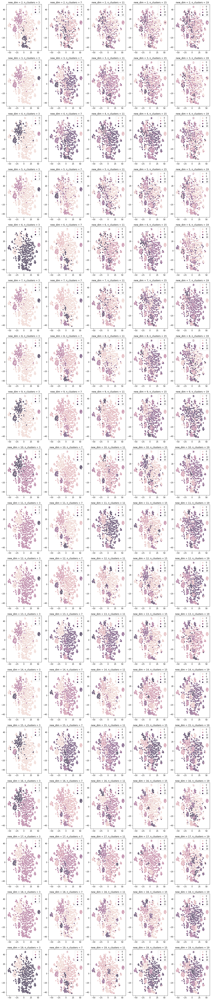

In [230]:
ny_tsne = Pipeline([
    ('tfidf', TfidfVectorizer(min_df=0.01)),
    ('TSNE', TSNE(2))
]).fit_transform(ny_df['text'])

n_grid = np.arange(2,20)
km_grid = np.arange(3,20,4)
fig, axs = plt.subplots(len(n_grid), len(gamma_grid), figsize=(20,100))
for i,n in enumerate(n_grid):
    for j, km in enumerate(km_grid):
        pipe = Pipeline([
            ('tf_idf', TfidfVectorizer(min_df=0.01)),
            ('svd', KernelPCA(kernel='rbf', n_components=n)),
            ('kmeans', KMeans(km))
        ])
        pipe.fit(ny_df['text'])        
        sns.scatterplot(ny_tsne[:,0],ny_tsne[:,1],hue=pipe.predict(ny_df['text']), ax=axs[i][j])
        axs[i][j].set_title('new_dim = %d, n_clusters = %d' % (n, km))
    

*Для наглядности нарисуем разделение точек по категории newDesk:*

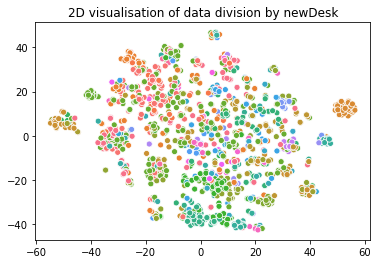

In [234]:
sns.scatterplot(ny_tsne[:,0],ny_tsne[:,1],hue=ny_df.newDesk, legend=False)
plt.title('2D visualisation of data division by newDesk')
plt.show()

*Можно увидеть, что в принципе многие тексты перемешаны между собой (вероятно, темы очень близкие друг к другу, из-за чего появляется большая компонента в середине), на графиках видно, что маленькие плотные компоненты, немного отстоящие от центра, как правило, выделяются в отдельные кластера при кластеризации. Стоит заметить, что в отличие от предыдущих моделей несмотря на то, что всё ещё используется K-means, при использовании KernelPCA получаемые кластера уже не так похожи друг на друга - выделяются кластера разных форм, размеров и плотностей.*

[Kaggle: Fashion-MNIST](https://www.kaggle.com/zalando-research/fashionmnist?select=fashion-mnist_test.csv)

In [289]:
fash_mnist = pd.read_csv('fashion-mnist_test.csv', nrows=5000)
fash_mnist.head(2)

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0,0,0,0,0,0,0,0,9,8,...,103,87,56,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,34,0,0,0,0,0,0,0,0,0


*В данных 10 классов, нарисуем по примеру из каждого класса:*

In [239]:
fash_mnist.label.unique()

array([0, 1, 2, 3, 8, 6, 5, 4, 7, 9], dtype=int64)

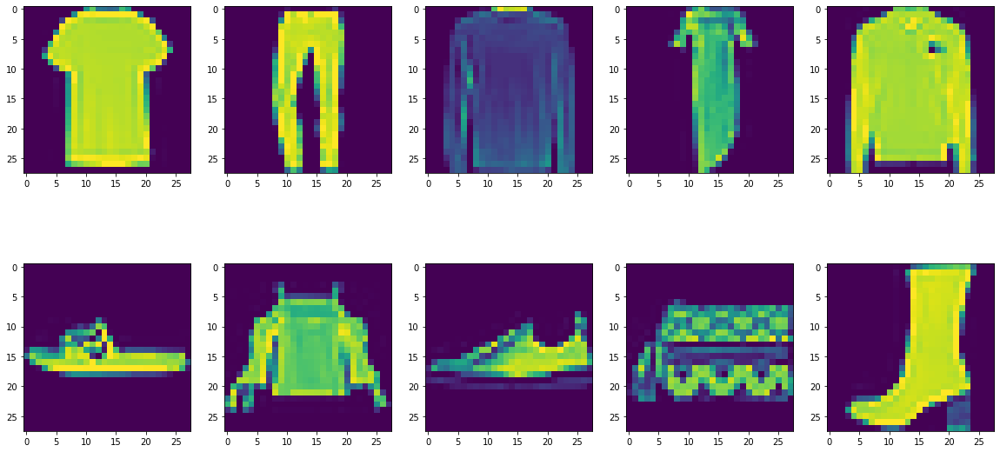

In [249]:
fig, axs = plt.subplots(2,5,figsize=(20,10))
for i in range(10):
    axs[i // 5][i % 5].imshow(np.squeeze(fash_mnist[fash_mnist.label == i].sample(1).iloc[:,1:].values.reshape(28,28,1)))

In [290]:
X = np.array(fash_mnist.iloc[:,1:] / 255).reshape(fash_mnist.shape[0], 28,28,1)    # reshape data, normalize

In [291]:
X_labeled, X_unlabeled, y_labeled, _ = train_test_split(X, np.array(fash_mnist.label),test_size=0.8)

*Обучим на размеченной части небольшую сеть для получения векторных представлений, которые потом кластеризуем:*

In [300]:
import keras
from keras.models import Sequential
from keras.preprocessing import image
from keras.layers.core import Activation, Reshape, Dense, Flatten
from keras.layers import Conv2D, MaxPool2D, BatchNormalization, Dropout
from keras.models import Model

model = Sequential([
    Conv2D(filters=16, kernel_size=(3,3), input_shape=(28,28,1), padding='same', activation='relu'),
    Conv2D(filters=32, kernel_size=(3,3), padding='same',activation='relu'),
    MaxPool2D(pool_size=(2,2)),
    Dropout(0.25),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(64, activation='softmax')
])

In [301]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 28, 28, 16)        160       
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 28, 28, 32)        4640      
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 14, 14, 32)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 14, 14, 32)        0         
_________________________________________________________________
flatten_7 (Flatten)          (None, 6272)              0         
_________________________________________________________________
dense_14 (Dense)             (None, 128)               802944    
_________________________________________________________________
dense_15 (Dense)             (None, 64)               

In [302]:
model.compile(optimizer='adam',
 loss='sparse_categorical_crossentropy',
 metrics=['accuracy'])

history = model.fit(
    X_labeled, y_labeled, batch_size=10, 
    validation_split = 0.2,
    shuffle=True, epochs=20
)

Epoch 1/20
80/80 [==============================] - 3s 26ms/step - loss: 1.9446 - accuracy: 0.4569 - val_loss: 0.8375 - val_accuracy: 0.7150
Epoch 2/20
80/80 [==============================] - 2s 23ms/step - loss: 0.7343 - accuracy: 0.7459 - val_loss: 0.6110 - val_accuracy: 0.7700
Epoch 3/20
80/80 [==============================] - 2s 23ms/step - loss: 0.5103 - accuracy: 0.8259 - val_loss: 0.6102 - val_accuracy: 0.7750
Epoch 4/20
80/80 [==============================] - 2s 23ms/step - loss: 0.3649 - accuracy: 0.8764 - val_loss: 0.5275 - val_accuracy: 0.8300
Epoch 5/20
80/80 [==============================] - 2s 22ms/step - loss: 0.2596 - accuracy: 0.9034 - val_loss: 0.5895 - val_accuracy: 0.8150
Epoch 6/20
80/80 [==============================] - 2s 25ms/step - loss: 0.1948 - accuracy: 0.9222 - val_loss: 0.6498 - val_accuracy: 0.7850
Epoch 7/20
80/80 [==============================] - 2s 27ms/step - loss: 0.2239 - accuracy: 0.9248 - val_loss: 0.6476 - val_accuracy: 0.8250
Epoch 8/20
80

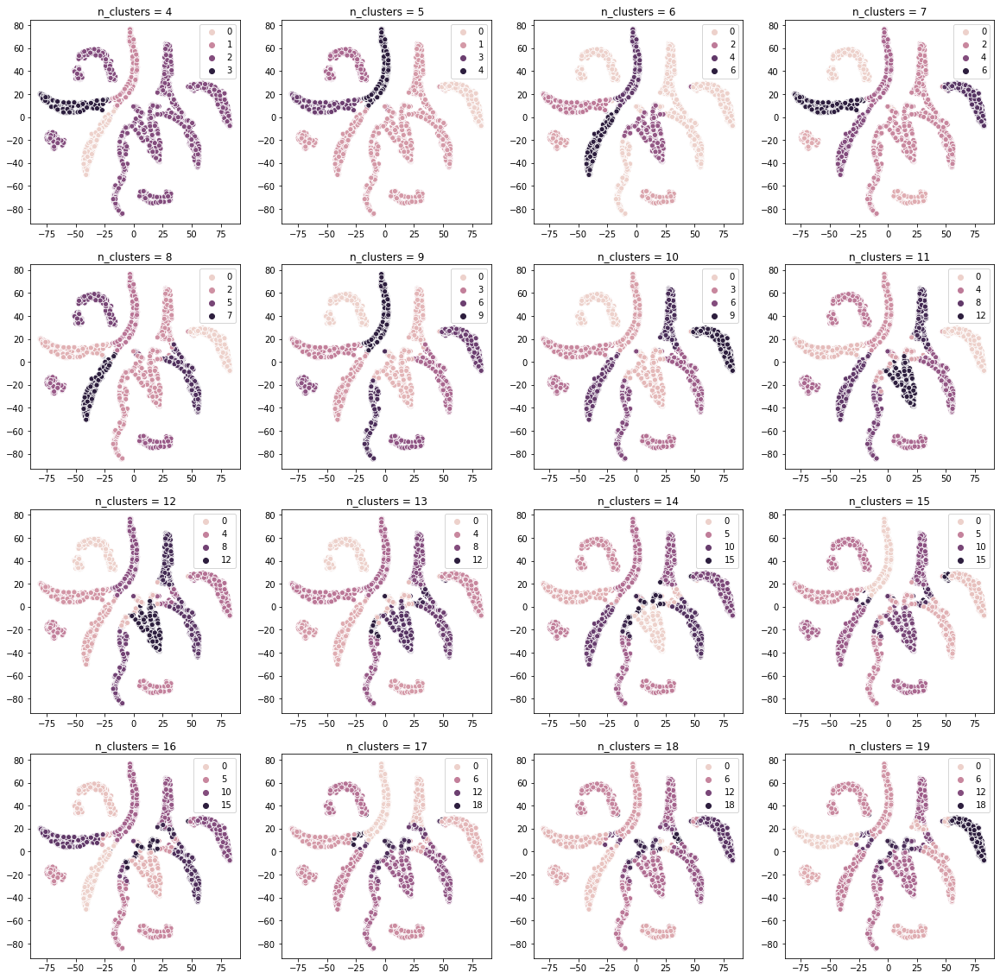

In [305]:
emb = model.predict(X)
fash_2d = TSNE(2).fit_transform(emb)
fig, axs = plt.subplots(4,4,figsize=(20,20))
n_grid = np.arange(4,20)
for i,n in enumerate(n_grid):
    km_6_2 = KMeans(n)
    km_6_2.fit(emb)
    sns.scatterplot(fash_2d[:,0],fash_2d[:,1],hue=km_6_2.labels_,ax=axs[i // 4][i % 4])
    axs[i//4][i%4].set_title('n_clusters = %d' % n)
plt.show()

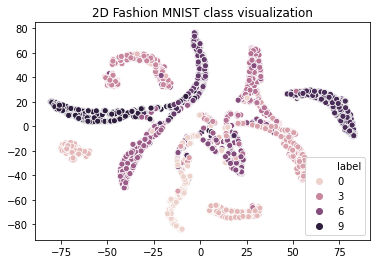

In [306]:
sns.scatterplot(fash_2d[:,0],fash_2d[:,1],hue=fash_mnist.label)
plt.title('2D Fashion MNIST class visualization')
plt.show()

*В данной выборке можем увидеть, что с помощью сети нашли векторные представления, которые визуально составляют хорошо выделяемые кластера. При этом если сравнить результат кластеризации при разных параметрах, можно заметить, что результат получается очень близким к истинному (в том числе и для значения параметра 10). Нарисуем несколько примеров из одних кластеров для результата кластеризации с 10 кластерами.*

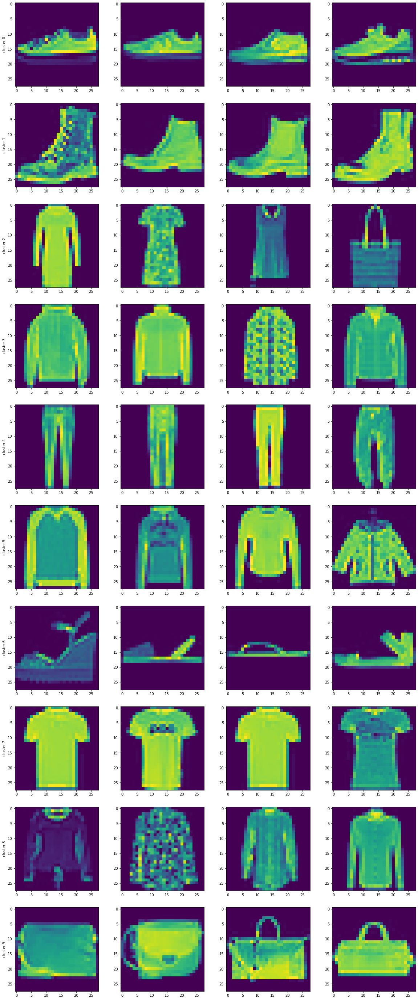

In [307]:
fig, axs = plt.subplots(10, 4, figsize=(20,50))
km_6_2 = KMeans(10)
km_6_2.fit(emb)
labels = km_6_2.labels_

for i in range(10):
    for j in range(4):
        if j == 0:
            axs[i][j].set(ylabel='cluster %d' % i)
        axs[i][j].imshow(np.squeeze(fash_mnist[labels == i].sample(1).iloc[:,1:].values.reshape(28,28,1)))
plt.show()

*Наиболее заметна разница в примерах с кластером 2 - в платья попала сумка, но в целом алгоритм довольно точно разделил кластеры между собой.*

**Задание 7 (1e-100 балла)**. Опишите свои ощущения от этой домашки, поощряется сравнение с предыдущей.

<img src="https://media.giphy.com/media/2t9xQY4q6ZiZbZal1w/giphy.gif" style="width: 400px">

*Но на самом деле эту домашку было в разы приятнее делать.*